# Capstone Project - The Battle of the Neighborhoods (Week4)
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction:](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)



## Introduction: <a name="introduction"></a>

In this project, we will explore **Japanese restaurants** in **New York**. I am originally from Japan and it's been 5 years since I left my country. And, I enjoy trying out a Japanese restaurant when I travel. The reason could be because I am not completely happy with the quality of Japanese restaurants in my city or simply I want to try a new restaurant as the number of the Japanese restaurants in my city is limited.
This report is targeted for people like me, who want to have Japanese food during the trip especially to a big city, New york. <br>

When people look for a restaurant, people mostly check the price, rating and location. Therefore, we will explore Japanese restaurants in New York based on these criteria.

## Data <a name="data"></a>

We will look into the price, rating, and location of Japanese restaurants in New York.

Also, we will check the density of hotels in each neighbourhood, although we will not look into the detail of hotels in this project.
People prefer to have dinner not too far from their hotel, and this information might be helpful when people consider which area to stay.

**Following data sources will be needed to extract/generate the required information:**

* Geographic coordinate of the boroughs and the neighborhoods in New York:
  https://geo.nyu.edu/catalog/nyu_2451_34572

* Getails of restaurants including price tier, rating, and location in New York: **Foursquare API**.

* Number of hotels in each Neighborhood Tabulation Areas (NTA):
  https://data.cityofnewyork.us/City-Government/Hotels-Properties-Citywide/tjus-cn27

* Gis data of Neighborhood Tabulation Areas (NTA) in New York:
  https://data.cityofnewyork.us/City-Government/Neighborhood-Tabulation-Areas-NTA-/cpf4-rkhq

* Geographic coordinate of New York: **Google Maps API geocoding**.

## Methodology <a name="methodology"></a>

In this project, we will find Japanese restaurants which are well balanced between price and rating.<br>

In the first step, we will collect the required data: rating and price tier of every Japanese restaurant in New York.<br>
In the second step, we will cluster each restaurant and find the well-balanced restaurants.<br>
In the final step, we will map the recommendation on the map.<br>

## Analysis <a name="Analysis"></a>

First, we will create a list of restaurants in New York and explore.

In [1]:
# Let's import main libraries forr this project

import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from pandas import DataFrame
import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

import matplotlib.cm as cm # Matplotlib and associated plotting modules
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn.cluster import KMeans# import k-means from clustering stage

import folium # map rendering library

import seaborn as sns #seaborn

import foursquare  #foursquare
client = foursquare.Foursquare(client_id='JLQFTPFWYFPHFNEIECENF2MSZ5HI4K4BW0UAXFZ4TT4YDJ54', client_secret='JU52CLY5QWNOCNXQABFCZ551MUJOXHPQZR4AOECOEFUQZX2B', version='20200426')

from scipy import stats #scipy

%matplotlib inline

print('Libraries imported.')

Libraries imported.


In [2]:
import wget 
url = 'https://cocl.us/new_york_dataset'
filename = wget.download(url, 'newyork_data.json')

In [3]:
with open('newyork_data.json') as json_data:
    neighborhoods_data = json.load(json_data)['features']

In [4]:
#Transform the data into a pandas dataframe
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude']
neighborhoods = pd.DataFrame(columns = column_names)

In [5]:
for data in neighborhoods_data:
    borough = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [6]:
neighborhoods.head(2)

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939


In [7]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [8]:
# Define Foursquare Credentials and Version

CLIENT_ID = ' '
CLIENT_SECRET = ' '
VERSION = '20200426' 
LIMIT = 100
radius = 500

In [12]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['id'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue',
                  'id',
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [ ]:
NY_venues = getNearbyVenues(names = neighborhoods['Neighborhood'],
                 latitudes = neighborhoods['Latitude'],
                 longitudes = neighborhoods['Longitude'])

In [14]:
# I stored the result in ny_venues_id.csv.
NY_venues = pd.read_csv('ny_venues_id.csv')

In [16]:
print('There are {} venues in NY'.format(NY_venues.shape[0]))

There are 9718 venues in NY


In [17]:
NY_venues.head(2)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,id,Venue Latitude,Venue Longitude,Venue Category
0,Wakefield,40.894705,-73.847201,Lollipops Gelato,4c537892fd2ea593cb077a28,40.894123,-73.845892,Dessert Shop
1,Wakefield,40.894705,-73.847201,Carvel Ice Cream,4c783cef3badb1f7e4244b54,40.890487,-73.848568,Ice Cream Shop


In [26]:
# We filter the result with venue category
NY_restaurant_1 = NY_venues[NY_venues['Venue Category'].str.contains('restaurant', na = False)]
NY_restaurant_2 = NY_venues[NY_venues['Venue Category'].str.contains('Restaurant', na = False)]

frame = [NY_restaurant_1, NY_restaurant_2]
NY_restaurant = pd.concat(frame, axis = 0)

In [43]:
NY_restaurant.drop_duplicates(subset ="id", keep = False, inplace = True) 

In [44]:
NY_restaurant.reset_index(drop = True, inplace = True)
NY_restaurant.head()

,Neighborhood,Latitude,Longitude,Venue,id,Venue Latitude,Venue Longitude,Venue Category
0,Brighton Beach,40.576825,-73.965094,Varenichnaya,4b75b067f964a5202f1d2ee3,40.576474,-73.965050,Varenyky restaurant
1,Co-op City,40.874294,-73.829939,Arby's,5bc797c82d2fd9002c1b3ec6,40.870411,-73.828606,Fast Food Restaurant
2,Co-op City,40.874294,-73.829939,Townhouse Restaurant,4be2b79d660ec9284d04ca3b,40.876086,-73.828868,Restaurant
3,Eastchester,40.887556,-73.827806,Fish & Ting,515cc20ce4b0deb133b8e89b,40.885656,-73.829197,Caribbean Restaurant
4,Eastchester,40.887556,-73.827806,Dyre Fish Market,4bfdd3dfb68d0f47fa6fe957,40.889318,-73.831453,Seafood Restaurant


In [45]:
print('There are {} restaurants in NY'.format(NY_restaurant.shape[0]))

There are 2040 restaurants in NY


In [46]:
NY_restaurant = NY_restaurant.rename(columns = {'Neighborhood Latitude': 'Latitude', 'Neighborhood Longitude' : 'Longitude'})

In [47]:
# We filter the result with venue category again to get Japanese restaurants.

NY_Japanese_1 = NY_restaurant[NY_restaurant['Venue Category'].str.contains('Japanese', na = False)]
NY_Japanese_2 = NY_restaurant[NY_restaurant['Venue Category'].str.contains('japanese', na = False)]

frame = [NY_Japanese_1, NY_Japanese_2]
NY_Japanese = pd.concat(frame, axis = 0)
NY_Japanese.drop_duplicates(subset ="id", keep = False, inplace = True) 
NY_Japanese.reset_index(drop=True, inplace=True)

In [48]:
print('There are {} Japanese restaurants in NY'.format(NY_Japanese.shape[0]))
print('Japanese restaurants account for {:.2%} of the restaurants in NY'.format(NY_Japanese.shape[0]/NY_restaurant.shape[0]))

There are 83 Japanese restaurants in NY
Japanese restaurants account for 4.07% of the restaurants in NY


In [49]:
NY_Japanese.head()

,Neighborhood,Latitude,Longitude,Venue,id,Venue Latitude,Venue Longitude,Venue Category
0,Belmont,40.857277,-73.888452,Sake II,4baeef6bf964a520cbe23be3,40.854265,-73.884616,Japanese Restaurant
1,Edgewater Park,40.821986,-73.813885,IKKO Hibachi Sushi Asian Bistro,5c79cb8360255e002c86ffaf,40.821156,-73.818528,Japanese Restaurant
2,Manhattan Terrace,40.614433,-73.957438,Masake,4bf890acabdaef3b69b7a184,40.618227,-73.957961,Japanese Restaurant
3,Kensington,40.642382,-73.980421,Sake Sushi,4d5c12a01e43236a87eb1583,40.644138,-73.976439,Japanese Restaurant
4,Prospect Heights,40.676822,-73.964859,Maison Yaki,5cb5e5f9a35f4600255406c6,40.677475,-73.969081,Japanese Restaurant


Now we will create a list with rating and price tier of each Japanese restaurant.

<b>Price tier (Price points) </b> at foursquare is defined as following.<br>
    The valid range of price points are [1,2,3,4], 1 being the least expensive, 4 being the most expensive. 
    For food venues, in the United States, 1 is < USD 10  an entree, 2 is USD 10-20 an entree, 3 is USD 20-30 an entree, 4 is > USD 30 an entree.<br> 
    https://developer.foursquare.com/docs/api-reference/venues/explore/

In [51]:
# get venue details

def getVenue(vID, radius=500):
    
    df2 = DataFrame()
    venue_ids = []
    frames = []
    requested_key = ['price.tier', 'rating']
    
    for ID in  vID:

           
        results = client.venues(ID)['venue']
        nom_data = json_normalize(results)
        
            
        if "price.tier" not in nom_data.columns:
            nom_data["price.tier"] = 'NONE'
            
        if "rating" not in nom_data.columns:
            nom_data["rating"] = 'NONE'
        
        venue_ids.append(ID)
        frames.append(nom_data[requested_key])
        
    df2 = pd.concat(frames, keys=venue_ids)
    
        
    return df2

In [52]:
Japanese_detail_new= getVenue(vID = NY_Japanese['id'])

C:\Users\Kaori\anaconda3\lib\site-packages\ipykernel_launcher.py:12: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  if sys.path[0] == '':


In [55]:
Japanese_detail_new.head()

,,price.tier,rating
4baeef6bf964a520cbe23be3,0,2,7.3
5c79cb8360255e002c86ffaf,0,2,NONE
4bf890acabdaef3b69b7a184,0,2,6.2
4d5c12a01e43236a87eb1583,0,2,8
5cb5e5f9a35f4600255406c6,0,2,7.9


In [56]:
Japanese_detail_new.reset_index(drop = False, inplace = True)

In [57]:
Japanese_detail_new.head(2)

,level_0,level_1,price.tier,rating
0,4baeef6bf964a520cbe23be3,0,2,7.3
1,5c79cb8360255e002c86ffaf,0,2,NONE


In [58]:
Japanese_detail_new = Japanese_detail_new[['level_0', 'price.tier', 'rating']]
Japanese_detail_new.columns = ['id', 'Price Tier', 'Rating']
Japanese_detail_new.head(2)

,id,Price Tier,Rating
0,4baeef6bf964a520cbe23be3,2,7.3
1,5c79cb8360255e002c86ffaf,2,NONE


In [124]:
# Merge the data 
Japanese_merged = pd.merge(left = Japanese_detail_new, right = NY_Japanese, left_on = 'id', right_on = 'id')
Japanese_merged.head(2)

,id,Price Tier,Rating,Neighborhood,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,4baeef6bf964a520cbe23be3,2,7.3,Belmont,40.857277,-73.888452,Sake II,40.854265,-73.884616,Japanese Restaurant
1,5c79cb8360255e002c86ffaf,2,NONE,Edgewater Park,40.821986,-73.813885,IKKO Hibachi Sushi Asian Bistro,40.821156,-73.818528,Japanese Restaurant


In [125]:
# clearn 
Japanese_merged = Japanese_merged[['Venue', 'id', 'Price Tier', 'Rating', 'Neighborhood', 'Latitude', 'Longitude', 'Venue Latitude', 'Venue Longitude', 'Venue Category']]
Japanese_merged = Japanese_merged.rename(columns = {'Price Tier':'Price_Tier'})

In [126]:
# We will remove the venue which does not contain Price Tire or Rating data.
Japanese_merged = Japanese_merged[Japanese_merged.Price_Tier != 'NONE']
Japanese_merged = Japanese_merged[Japanese_merged.Rating != 'NONE']

Japanese_merged.shape

(80, 10)

In [127]:
Japanese_merged.dtypes

Venue               object
id                  object
Price_Tier          object
Rating              object
Neighborhood        object
Latitude           float64
Longitude          float64
Venue Latitude     float64
Venue Longitude    float64
Venue Category      object
dtype: object

In [128]:
# clean data type
Japanese_merged.Price_Tier = Japanese_merged.Price_Tier.astype(int)
Japanese_merged.Rating = Japanese_merged.Rating.astype(float)

In [129]:
# Check the frequency of the Price Tier.
Japanese_merged['Price_Tier'].value_counts().to_frame()

,Price_Tier
2,59
3,12
4,8
1,1


In [324]:
print('Tier 2 account for {:.2%}'.format(59/80))

Tier 2 account for 73.75%


In [317]:
df_price = Japanese_merged['Price_Tier'].value_counts().to_frame()
df_price.columns = ['Number of Hotel']
df_price.sort_index(inplace = True)

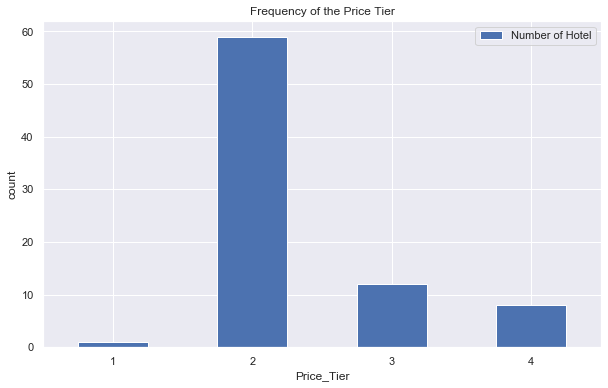

In [321]:
df_price.plot(kind = 'bar', figsize = (10, 6))

plt.xlabel("Price_Tier")
plt.ylabel("count")
plt.title("Tier")
plt.xticks(rotation = 0)
plt.title('Frequency of the Price Tier')


plt.show()

Rating at foursquare is between 0 to 10, and 10 is the best rating.

In [131]:
# Check the rating
Japanese_merged['Rating'].value_counts().to_frame()

,Rating
8.7,8
8.0,6
8.8,6
7.3,5
8.3,5
7.9,4
8.2,4
8.6,4
6.6,3
7.5,3


In [326]:
Japanese_merged['Rating'].describe()

count    80.000000
mean      8.013750
std       0.800434
min       5.900000
25%       7.500000
50%       8.100000
75%       8.700000
max       9.200000
Name: Rating, dtype: float64

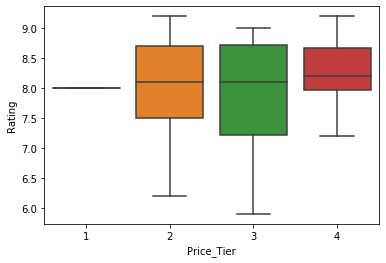

In [132]:
# We will check if there is any relationship between Rating and Price Tier
sns.boxplot(x = 'Price_Tier', y = 'Rating', data = Japanese_merged)

From this plot, you can see that there is only a little difference of median of the rating between each price tier.<br>
Howerver, the lowest rating of the most expensive tier, Tier 4, is much higher than other price tiers.

In [133]:
# Let's make bins for rating, and merge it into the dataframe.
bins = np.linspace(min(Japanese_merged["Rating"]), max(Japanese_merged["Rating"]), 4)
bins

array([5.9, 7. , 8.1, 9.2])

In [134]:
group_names = ['Low', 'Medium', 'High']
Japanese_merged['Rating-binned'] = pd.cut(Japanese_merged['Rating'], bins, labels=group_names, include_lowest=True )
Japanese_merged[['Rating','Rating-binned']].head(2)

,Rating,Rating-binned
0,7.3,Medium
2,6.2,Low


In [135]:
# Let's give price mark to make it more understandable in the label in the map later.
Price_Mark = {1:'$', 2:'$$', 3:'$$$', 4:'$$$+'}
Price_list = []

for price in Japanese_merged['Price_Tier']:
    Price_list.append(Price_Mark[price]) 

In [140]:
Japanese_merged['Price_Mark'] = Price_list

In [141]:
# change order of the columns
Japanese_merged = Japanese_merged[['Venue', 'id', 'Price_Tier', 'Price_Mark', 'Rating', 'Rating-binned', 'Neighborhood', 'Latitude', 'Longitude', 'Venue Latitude', 'Venue Longitude', 'Venue Category']]

In [142]:
Japanese_merged.head()

,Venue,id,Price_Tier,Price_Mark,Rating,Rating-binned,Neighborhood,Latitude,Longitude,Venue Latitude,Venue Longitude,Venue Category
0,Sake II,4baeef6bf964a520cbe23be3,2,$$,7.3,Medium,Belmont,40.857277,-73.888452,40.854265,-73.884616,Japanese Restaurant
2,Masake,4bf890acabdaef3b69b7a184,2,$$,6.2,Low,Manhattan Terrace,40.614433,-73.957438,40.618227,-73.957961,Japanese Restaurant
3,Sake Sushi,4d5c12a01e43236a87eb1583,2,$$,8.0,Medium,Kensington,40.642382,-73.980421,40.644138,-73.976439,Japanese Restaurant
4,Maison Yaki,5cb5e5f9a35f4600255406c6,2,$$,7.9,Medium,Prospect Heights,40.676822,-73.964859,40.677475,-73.969081,Japanese Restaurant
5,Warude,5b3bcb69bfc6d0002ca9bf17,2,$$,8.1,Medium,Bedford Stuyvesant,40.687232,-73.941785,40.684410,-73.944118,Japanese Restaurant


### Let's map restaurants.

In [115]:
# get the Geographic coordinate of New York to map the restaurants.
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The Geographic coordinate of New York City are {}, {}.'.format(latitude, longitude))

The Geographic coordinate of New York City are 40.7127281, -74.0060152.


Let's mape the Japanese restaurants

In [147]:
# Check locations of the restaurants
from folium import plugins

NY_restaurant_map = folium.Map(location = [latitude, longitude], zoom_start = 11)

restaurants = plugins.MarkerCluster().add_to(NY_restaurant_map)

for lat, lng, ven, cat in zip(Japanese_merged['Venue Latitude'], Japanese_merged['Venue Longitude'], Japanese_merged['Venue'], Japanese_merged['Neighborhood']):
    label = '{}({})'.format(ven, cat)
    folium.Marker(
        location = [lat, lng],
        icon = None,
        popup = label,
    ).add_to(restaurants)
    
NY_restaurant_map

You can see that Manhattan has a lot of Japanese restaurants

Now, let's create a map of Japanese restaurant based on the price tier.

In [146]:
# Create a map to check restaurants with Price Tier
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=11)
colors = {'$$$+':'darkred', '$$$':'red','$$':'orange', '$':'white'}

# add markers to map
for lat, lng, ven, mark, nei in zip(Japanese_merged['Venue Latitude'], Japanese_merged['Venue Longitude'], Japanese_merged['Venue'], Japanese_merged['Price_Mark'],  Japanese_merged['Neighborhood']):
    label = '{}, {} ({})'.format(ven, mark, nei)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon = folium.Icon(color = colors[mark])
    ).add_to(map_newyork)  

    
map_newyork

You can see that in Manhattan, East 39th near Grand Central Terminal and East 83rd Street have high-end restaurants.<br>
Staten island has only a few restaurants but the avarage price is high.

Now let's create a map with the rating.

In [150]:
# Create a map to check restaurants with Rating
# create map of New York using latitude and longitude values
map_newyork_rate = folium.Map(location=[latitude, longitude], zoom_start=11)
colors = {'Low':'lightgray', 'Medium':'lightgreen','High':'green'}

# add markers to map
for lat, lng, ven, rate in zip(Japanese_merged['Venue Latitude'], Japanese_merged['Venue Longitude'], Japanese_merged['Venue'], Japanese_merged['Rating-binned']):
    label = '{}, Rating:{}'.format(ven, rate)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon = folium.Icon(color = colors[rate])
    ).add_to(map_newyork_rate)  
    
map_newyork_rate

Rating of the restaurants in the central Manhattan tends to be high.<br>
However, if you go further from city centre, the rating tends to go lower.

### Let's cluster restaurants based on rating and price tier by k-means

In [153]:
# find the best K
Japanese_Clustering = Japanese_merged[['Price_Tier', 'Rating']]

Ks = 10
inertias = np.zeros((Ks-1))
for n in range(1,Ks):
    
    kmeans = KMeans(n_clusters=n, random_state=0, n_init = 12).fit(Japanese_Clustering)
    inertias[n-1] = kmeans.inertia_

inertias

array([86.502375  , 50.51020833, 25.55200064, 18.03139058, 13.75576558,
       10.78553095,  8.15900397,  6.53859737,  4.86934737])

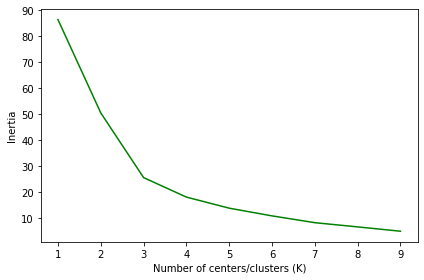

In [154]:
# plot the inertia with the different k to find the better balance

plt.plot(range(1,Ks),inertias,'g')
plt.ylabel('Inertia')
plt.xlabel('Number of centers/clusters (K)')
plt.tight_layout()
plt.show()

In [155]:
# We will use k = 4.

kclusters = 4
kmeans = KMeans(n_clusters=kclusters, random_state=0, n_init = 12).fit(Japanese_Clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:15] 

array([3, 1, 3, 3, 3, 0, 0, 3, 3, 2, 2, 0, 1, 1, 0])

In [156]:
# Insert the Cluster label in the data frame
Japanese_merged.insert(0, 'Cluster Labels', kmeans.labels_)

In [157]:
Japanese_merged.head()

,Cluster Labels,Venue,id,Price_Tier,Price_Mark,Rating,Rating-binned,Neighborhood,Latitude,Longitude,Venue Latitude,Venue Longitude,Venue Category
0,3,Sake II,4baeef6bf964a520cbe23be3,2,$$,7.3,Medium,Belmont,40.857277,-73.888452,40.854265,-73.884616,Japanese Restaurant
2,1,Masake,4bf890acabdaef3b69b7a184,2,$$,6.2,Low,Manhattan Terrace,40.614433,-73.957438,40.618227,-73.957961,Japanese Restaurant
3,3,Sake Sushi,4d5c12a01e43236a87eb1583,2,$$,8.0,Medium,Kensington,40.642382,-73.980421,40.644138,-73.976439,Japanese Restaurant
4,3,Maison Yaki,5cb5e5f9a35f4600255406c6,2,$$,7.9,Medium,Prospect Heights,40.676822,-73.964859,40.677475,-73.969081,Japanese Restaurant
5,3,Warude,5b3bcb69bfc6d0002ca9bf17,2,$$,8.1,Medium,Bedford Stuyvesant,40.687232,-73.941785,40.684410,-73.944118,Japanese Restaurant


In [222]:
# Let's check the detail.

column = ['Cluster', 'Count', 'Mean Price Tier', 'Mean Rating']

Japanese_clustered = pd.DataFrame(columns = column)

In [223]:
for n in range(0, 4):
    count = Japanese_merged[Japanese_merged['Cluster Labels'] == n]['Price_Tier'].count()
    price = Japanese_merged[Japanese_merged['Cluster Labels'] == n]['Price_Tier'].mean()
    rate = Japanese_merged[Japanese_merged['Cluster Labels'] == n]['Rating'].mean()
    clus = format(str(n))
    Japanese_clustered = Japanese_clustered.append({
                                            'Cluster': n, 'Count': count,'Mean Price Tier':price, 'Mean Rating':rate}, ignore_index=True)

In [226]:
Japanese_clustered.Cluster = Japanese_clustered.Cluster.astype(int)
Japanese_clustered

,Cluster,Count,Mean Price Tier,Mean Rating
0,0,28.0,2.000000,8.671429
1,1,11.0,2.272727,6.563636
2,2,16.0,3.500000,8.406250
3,3,25.0,2.000000,7.664000


In [278]:
(Japanese_clustered['Count'][0] + Japanese_clustered['Count'][2]) /80

0.55

Based on this, we can reccomend Japanese restaurants as following.<br>
If you want to enjoy meal casually with lower budjet, a restaurant in Cluster 0 is a great choice.<br>
If you want to enjoy meal with a little more budjet, a restaurant in Cluster 2 is a great choice.

### We will map the Japanese restaurants in cluster 0 and 2 on the choropleth maps based on the density of hotels in New York.

When you have dinner, you also consider how far the restaurants is from the hotel where you are staying.<br>
We will use a choropleth maps based on the density of hotels, although we do not look into the details of the hotel.<br>
This is just to give you an idea when you are selecting which area to stay.

In [228]:
# download Gis data
import wget
url = 'https://data.cityofnewyork.us/api/views/q2z5-ai38/rows.json?accessType=DOWNLOAD'
filename = wget.download(url, 'NTA.geojson')

In [239]:
# download the same data in csv for the calcuration later
import wget
url = 'https://data.cityofnewyork.us/api/views/q2z5-ai38/rows.csv?accessType=DOWNLOAD'
filename = wget.download(url, 'nynta.csv')

In [231]:
import folium
from folium import plugins

In [235]:
# download Hotel Properties data
import wget
url = 'https://data.cityofnewyork.us/api/views/tjus-cn27/rows.csv?accessType=DOWNLOAD'
filename = wget.download(url, 'nynta.csv')

In [236]:
df_hotel = pd.read_csv('Hotels_Properties_Citywide.csv')
df_hotel.head(2)

,PARID,BOROCODE,BLOCK,LOT,TAXYEAR,STREET NUMBER,STREET NAME,Postcode,BLDG_CLASS,TAXCLASS,OWNER_NAME,Borough,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
0,1000080039,1,8,39,2021,32,PEARL STREET,10004,H3,4,"32 PEARL, LLC",MANHATTAN,40.703235,-74.012421,101.0,1.0,9.0,1078968.0,1.000080e+09,Battery Park City-Lower Manhattan
1,1000080051,1,8,51,2021,6,WATER STREET,10004,H2,4,AI IV LLC,MANHATTAN,40.702744,-74.012201,101.0,1.0,9.0,1090472.0,1.000080e+09,Battery Park City-Lower Manhattan


In [237]:
hotel_count = df_hotel['NTA'].value_counts().to_frame()
hotel_count.head(2)

,NTA
Midtown-Midtown South,702
SoHo-TriBeCa-Civic Center-Little Italy,427


In [238]:
hotel_count.reset_index(drop = False, inplace = True)
hotel_count.rename(columns = {'index':'NTAName', 'NTA':'Count'}, inplace = True)
hotel_count.head(2)

,NTAName,Count
0,Midtown-Midtown South,702
1,SoHo-TriBeCa-Civic Center-Little Italy,427


In [245]:
df_nygeo = pd.read_csv('nynta.csv')

In [246]:
df_nygeo.head()

,BoroCode,BoroName,the_geom,CountyFIPS,NTACode,NTAName,Shape_Leng,Shape_Area
0,3,Brooklyn,MULTIPOLYGON (((-73.97604935657381 40.63127590...,47,BK88,Borough Park,39247.227831,5.400502e+07
1,4,Queens,MULTIPOLYGON (((-73.80379022888098 40.77561011...,81,QN51,Murray Hill,33266.904797,5.248828e+07
2,4,Queens,MULTIPOLYGON (((-73.8610972440186 40.763664477...,81,QN27,East Elmhurst,19816.712074,1.972685e+07
3,4,Queens,MULTIPOLYGON (((-73.75725671509139 40.71813860...,81,QN07,Hollis,20976.335574,2.288777e+07
4,1,Manhattan,MULTIPOLYGON (((-73.94607828674226 40.82126321...,61,MN06,Manhattanville,17040.685413,1.064708e+07


In [247]:
NY_hotel_geo = pd.merge(left = df_nygeo, right = hotel_count, left_on = 'NTAName', right_on = 'NTAName')

In [248]:
NY_hotel_geo.head()

,BoroCode,BoroName,the_geom,CountyFIPS,NTACode,NTAName,Shape_Leng,Shape_Area,Count
0,3,Brooklyn,MULTIPOLYGON (((-73.97604935657381 40.63127590...,47,BK88,Borough Park,39247.227831,5.400502e+07,4
1,4,Queens,MULTIPOLYGON (((-73.8610972440186 40.763664477...,81,QN27,East Elmhurst,19816.712074,1.972685e+07,7
2,1,Manhattan,MULTIPOLYGON (((-73.94607828674226 40.82126321...,61,MN06,Manhattanville,17040.685413,1.064708e+07,1
3,2,Bronx,MULTIPOLYGON (((-73.83936794316948 40.84088297...,5,BX59,Westchester-Unionport,26557.409326,2.394521e+07,3
4,2,Bronx,MULTIPOLYGON (((-73.78833349834532 40.83466712...,5,BX10,Pelham Bay-Country Club-City Island,138249.436420,4.013453e+07,1


In [249]:
NY_hotel_geo['Hotel_Density'] = NY_hotel_geo['Count'] / NY_hotel_geo['Shape_Area']

In [250]:
NY_hotel_geo.head(2)

,BoroCode,BoroName,the_geom,CountyFIPS,NTACode,NTAName,Shape_Leng,Shape_Area,Count,Hotel_Density
0,3,Brooklyn,MULTIPOLYGON (((-73.97604935657381 40.63127590...,47,BK88,Borough Park,39247.227831,5.400502e+07,4,7.406719e-08
1,4,Queens,MULTIPOLYGON (((-73.8610972440186 40.763664477...,81,QN27,East Elmhurst,19816.712074,1.972685e+07,7,3.548464e-07


In [252]:
# generate choropleth map using the hotel density
ny_geo = r'NTA.geojson'


Hotel_density = folium.Map(location=[latitude, longitude], zoom_start=11)

Hotel_density.choropleth(
    geo_data = ny_geo,
    data = NY_hotel_geo,
    columns=['NTAName', 'Hotel_Density'],
    key_on='feature.properties.ntaname',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Number of Hotels',
    reset=True)

# display map
Hotel_density

Now let's map cluster 0 & 2 on this map.

In [272]:
# Prepare dataframe

Clusters = [0, 2]
Cluster0and2 = Japanese_merged.loc[Japanese_merged['Cluster Labels'].isin(Clusters)]

In [328]:
Cluster0and2.reset_index(drop = True, inplace = True)
Cluster0and2.head()

,Cluster Labels,Venue,id,Price_Tier,Price_Mark,Rating,Rating-binned,Neighborhood,Latitude,Longitude,Venue Latitude,Venue Longitude,Venue Category
0,0,Iron Chef House,479ccb47f964a5206b4d1fe3,2,$$,8.3,High,Brooklyn Heights,40.695864,-73.993782,40.697406,-73.992560,Japanese Restaurant
1,0,Hibino,48a41073f964a52091511fe3,2,$$,9.1,High,Cobble Hill,40.687920,-73.998561,40.690076,-73.996497,Japanese Restaurant
2,2,Karasu,5739c66c498e7ef6085cec4f,3,$$$,8.7,High,Fort Greene,40.688527,-73.972906,40.689577,-73.973290,Japanese Restaurant
3,2,Sushi Katsuei,5276d39a498eb1a5d90096e4,3,$$$,8.7,High,Park Slope,40.672321,-73.977050,40.670615,-73.978504,Japanese Restaurant
4,0,U-Gu,591f7c5f35f9836382455eca,2,$$,8.8,High,Clinton Hill,40.693229,-73.967843,40.693760,-73.962913,Japanese Restaurant


In [329]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

markers_colors = {0:'pink', 1:'blue', 2: 'orange', 3: 'green'}
for cluster, lat, lng, ven, rate, price  in zip(Cluster0and2['Cluster Labels'], Cluster0and2['Venue Latitude'], Cluster0and2['Venue Longitude'], Cluster0and2['Venue']
                                  , Cluster0and2['Rating'], Cluster0and2['Price_Mark']):

    label = '{}, Cluster:{}, Rating:{}, {}'.format(ven, cluster, rate, price)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon = folium.Icon(color = markers_colors[cluster])
    ).add_to(map_clusters)  
    

ny_geo = r'NTA.geojson'

map_clusters.choropleth(
    geo_data = ny_geo,
    data = NY_hotel_geo,
    columns=['NTAName', 'Hotel_Density'],
    key_on='feature.properties.ntaname',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Number of Hotels',
    reset=True)


# display map
    
map_clusters


## Results and Discussion <a name="results"></a>

In New York, most of the Japanese restaurants are affordable.
You can have an entree between USD 10-20 in 74% of the restaurants.
And, there is very little difference in the average rating between each price tier, and it shows that you can find a nice restaurant within your budget.

By k-mean clustering, we selected 2 clusters of restraints with good rating and 2 different budgets.
From the map, you can see that Midtown-Midtown South area and Turtle Bay-East Midtown have a lot of hotels, and also well-balanced Japanese restaurants nearby.

For future study, I'd like to also look into the detail of hotels such as location, stars, price and so on.
And, as the number Japanese restaurants are relatively small, it is also important to compare the data with other restaurants or other cities in order to get the threshold of the rating above which is considered "good restaurant". 
However, I could not get venues details of all restaurants this time due to the limitation of foursquare account I have.
Also, rating system is subjective and the same restaurant can be rated quite differently between by the people from Japan and by others. This also should be kept in mind.

## Conclusion <a name="conclusion"></a>

In this project, I studied Japanese restaurants in New York. <br>
While the number of Japanese restaurants is continuously growing in many international cities, not all the restaurants have a good quality.<br>
However, New York has many great Japanese restaurants with different price ranges and you can find a restaurant you can enjoy.<br>